In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from scipy import signal, linalg
from scipy.io import wavfile
from scipy.fftpack import fft
from scipy.fft import fftshift
import IPython.display as ipd
rng = np.random.default_rng()

In [2]:
fs, data = wavfile.read("Recording.wav")
fs, data.shape

(44100, (2356704, 2))

In [5]:
ipd.Audio("./Recording.wav")

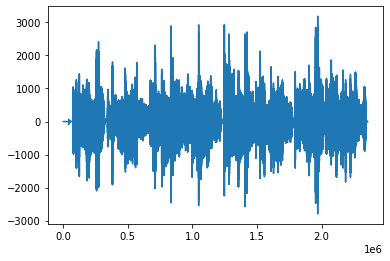

In [6]:
data_truncated = data
N = data_truncated.shape[0]
plt.plot(np.arange(data_truncated.shape[0]), data_truncated[: , 0])

# Note Extraction

The idea here is to find the peaks of the DFT of the entire sone, match the freqeuncy values with the corresponding note value.

In [7]:
notes_chart = {0: 'C',
               1: 'C#',
               2: 'D',
               3: 'D#',
               4: 'E',
               5: 'F',
               6: 'F#',
               7: 'G',
               8: 'G#',
               9: 'A',
               10: 'A#',
               11: 'B'}
               
notes_index = {'C':0,
               'C#':1,
               'D':2,
               'D#':3,
               'E':4,
               'F':5,
               'F#':6,
               'G':7,
               'G#':8,
               'A':9,
               'A#':10,
               'B':11}

notes_freq = 440*(2**(np.arange(-45, 51)/12))

def find_note(freq, n_f, n_c):
    prev_err = np.inf
    j = 0
    for i in range(len(n_f)):
        if (freq - n_f[i])**2 - prev_err > 0:
            break
        prev_err = (freq - n_f[i])**2
        j = i
    return n_c[j%12], j//12, n_f[j]


In [8]:
notes_freq

array([  32.70319566,   34.64782887,   36.70809599,   38.89087297,
         41.20344461,   43.65352893,   46.24930284,   48.9994295 ,
         51.9130872 ,   55.        ,   58.27047019,   61.73541266,
         65.40639133,   69.29565774,   73.41619198,   77.78174593,
         82.40688923,   87.30705786,   92.49860568,   97.998859  ,
        103.82617439,  110.        ,  116.54094038,  123.47082531,
        130.81278265,  138.59131549,  146.83238396,  155.56349186,
        164.81377846,  174.61411572,  184.99721136,  195.99771799,
        207.65234879,  220.        ,  233.08188076,  246.94165063,
        261.6255653 ,  277.18263098,  293.66476792,  311.12698372,
        329.62755691,  349.22823143,  369.99442271,  391.99543598,
        415.30469758,  440.        ,  466.16376152,  493.88330126,
        523.2511306 ,  554.36526195,  587.32953583,  622.25396744,
        659.25511383,  698.45646287,  739.98884542,  783.99087196,
        830.60939516,  880.        ,  932.32752304,  987.76660

In [9]:
def cluster(arr, dist_thresh):
    prev = arr[0]
    time_duration = []
    for i in range(1, len(arr)):
        if arr[i] - arr[i-1] > dist_thresh:
            time_duration += [(prev, arr[i-1]-prev)]
            prev = arr[i]
    time_duration += [(prev, arr[-1]-prev)]
    return time_duration

In [10]:
def construct_note(frequency, length, amplitude=4096, sample_rate=44100):
    try:
        time_points = np.linspace(0, length, int(length*sample_rate))
    except:
        print(frequency, length, length*sample_rate, int(length*sample_rate))
        raise Exception('Failed')
    d = np.sin(2*np.pi*frequency*time_points) if frequency else np.zeros(len(time_points))
    d = amplitude*d
    return d

def construct_sound(arr, sample_rate=44100):
    length = []
    notes = []
    
    for note, duration in arr:
        sound = construct_note(0, duration[0][0], sample_rate)
        for j in range(len(duration) - 1):
            rest = duration[j+1][0] - (duration[j][0] + duration[j][1])
            sound = np.append(sound, construct_note(note[2], duration[j][1], sample_rate))
            sound = np.append(sound, construct_note(0, rest, sample_rate))
        sound = np.append(sound, construct_note(note[2], duration[-1][1], sample_rate))
        notes += [sound]
        length += [len(sound)]
        
    max_len = max(length)
    final_sound = np.pad(notes[0], (0, max_len-len(notes[0])))
    final_sounds = [final_sound]
    for n in notes[1:]:
        final_sound = final_sound + np.pad(n, (0, max_len-len(n)))
        final_sounds += [np.pad(n, (0, max_len-len(n)))]
    return final_sound.astype(np.int16), final_sounds

def play(sound, file_name, sample_rate = 44100):
    wavfile.write(file_name, sample_rate, sound)
    return ipd.Audio(file_name)


    


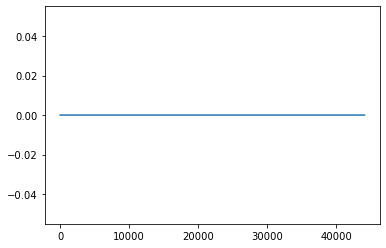

In [11]:
rest = construct_note(0, 1)
plt.plot(range(len(rest)), rest)

In [12]:
a = construct_note(261, 0.2)
play(a.astype(np.int16), 'testing.wav')

## Note extraction + segmentation idea 2

The idea here is to query each avaliable note and see when each notes happen. 

<ipython-input-13-4ea0da50eac0>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(t, f, Sxx, cmap='jet')


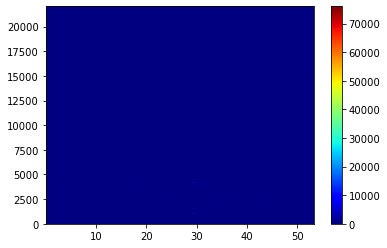

In [13]:
f, t, Sxx = signal.spectrogram(data_truncated.T[0], fs, nperseg=fs//10)
plt.pcolormesh(t, f, Sxx, cmap='jet')
plt.colorbar()

<ipython-input-14-0db0e595d47c>:1: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(t, f[:150], Sxx[:150], cmap='jet')


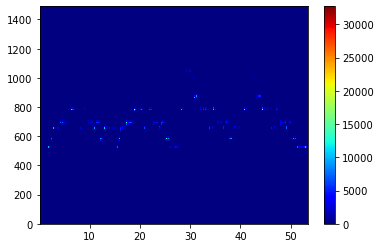

In [14]:
plt.pcolormesh(t, f[:150], Sxx[:150], cmap='jet')
plt.colorbar()

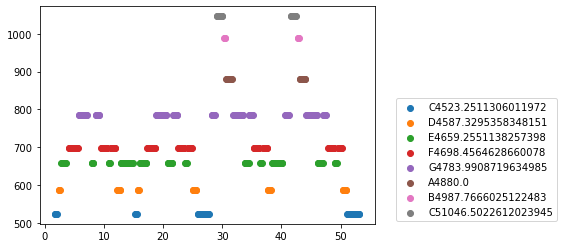

In [15]:

max_energy = np.amax(Sxx)
quiet_threshold = max_energy**0.5
freq_bound_low, freq_bound_high = 200, 1050
notes_in_song2 = []
for n in range(len(notes_freq)):
    i = np.argmin((f-notes_freq[n])**2)
    if np.max(Sxx[i]) >  quiet_threshold and notes_freq[n] > freq_bound_low and notes_freq[n] < freq_bound_high:
        note_duration = t[Sxx[i] > quiet_threshold]
        if len(note_duration) > 1:
            notes_in_song2 += [((notes_chart[n%12], n//12, notes_freq[n]), note_duration)]

for note_name, durations in notes_in_song2:
    plt.scatter(durations, np.full(len(durations), note_name[2]), label=note_name[0] + str(note_name[1]) + str(note_name[2]))

plt.legend(bbox_to_anchor = (1.05, 0.6))


In [16]:
notes_in_song2

[(('C', 4, 523.2511306011972),
  array([ 1.71260771,  1.80011338,  1.88761905,  1.97512472,  2.06263039,
         15.27598639, 15.36349206, 15.45099773, 15.5385034 , 25.86417234,
         25.951678  , 26.03918367, 26.12668934, 26.21419501, 26.73922902,
         26.82673469, 26.91424036, 27.00174603, 27.0892517 , 27.17675737,
         27.26426304, 27.35176871, 27.43927438, 27.52678005, 27.61428571,
         27.70179138, 51.15331066, 51.24081633, 51.328322  , 51.41582766,
         51.50333333, 51.590839  , 51.67834467, 51.76585034, 51.85335601,
         51.94086168, 52.02836735, 52.11587302, 52.20337868, 52.29088435,
         52.37839002, 52.46589569, 52.55340136, 52.64090703, 52.7284127 ,
         52.81591837, 52.90342404, 52.99092971, 53.07843537, 53.16594104])),
 (('D', 4, 587.3295358348151),
  array([ 2.32514739,  2.41265306,  2.50015873, 12.21328798, 12.30079365,
         12.38829932, 12.47580499, 12.56331066, 12.65081633, 12.738322  ,
         15.71351474, 15.80102041, 15.88852608,

In [17]:
res = [(note, cluster(duration, 1)) for note, duration in notes_in_song2]
res

[(('C', 4, 523.2511306011972),
  [(1.712607709750567, 0.35002267573696155),
   (15.275986394557822, 0.26251700680272094),
   (25.86417233560091, 1.8376190476190466),
   (51.15331065759637, 2.012630385487526)]),
 (('D', 4, 587.3295358348151),
  [(2.3251473922902495, 0.17501133786848078),
   (12.213287981859411, 0.5250340136054419),
   (15.713514739229025, 0.17501133786848122),
   (24.989115646258504, 0.6125396825396798),
   (37.67743764172336, 0.5250340136054419),
   (50.36575963718821, 0.6125396825396763)]),
 (('E', 4, 659.2551138257398),
  [(2.762675736961451, 0.7875510204081633),
   (7.9255102040816325, 0.26251700680272094),
   (10.813197278911565, 0.17501133786848122),
   (12.825827664399092, 2.1001360544217693),
   (16.063537414965985, 1.0500680272108838),
   (20.788843537414966, 0.7875510204081628),
   (23.764036281179138, 0.26251700680272094),
   (33.82718820861678, 0.6125396825396834),
   (36.45235827664399, 0.2625170068027174),
   (38.46498866213152, 1.6626077097505672),
   (46

In [18]:
track, rec = construct_sound(res, sample_rate=fs)
play(track, 'spectrogram_method.wav', sample_rate=fs)

<ipython-input-19-349843970990>:3: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(time, freq[:100], S[:100], cmap='jet')


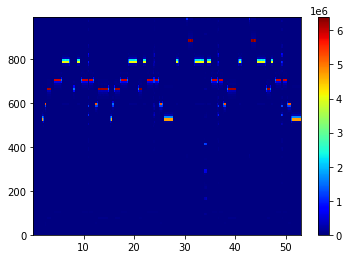

In [19]:
sample_freq, resyn = wavfile.read("spectrogram_method.wav")
freq, time, S = signal.spectrogram(resyn.T, sample_freq, nperseg=sample_freq//10)
plt.pcolormesh(time, freq[:100], S[:100], cmap='jet')
plt.colorbar()